       age  d18O
0 -16.5010 -9.50
1   0.0000 -9.66
2  19.9980 -9.58
3  38.2475 -9.50
4  56.4970 -9.33
641264.4
-16.501
           age       pre
8000       0.0  0.016280
7999     100.0  0.016431
7998     200.0  0.016568
7997     300.0  0.016690
7996     400.0  0.016798
...        ...       ...
4     799600.0  0.012880
3     799700.0  0.012527
2     799800.0  0.012161
1     799900.0  0.011782
0     800000.0  0.011391

[8001 rows x 2 columns]


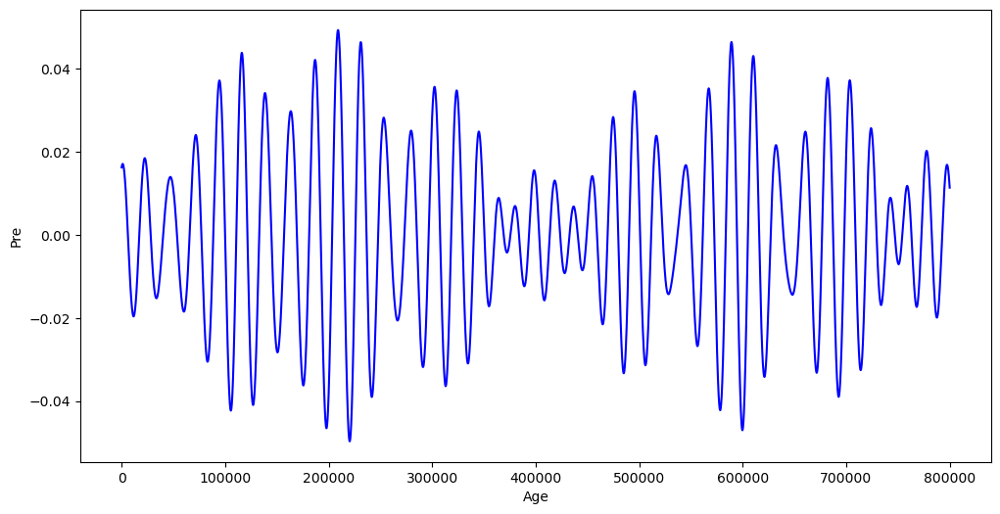

           age       obl
8000       0.0  0.409093
7999     100.0  0.409320
7998     200.0  0.409547
7997     300.0  0.409773
7996     400.0  0.410000
...        ...       ...
4     799600.0  0.404703
3     799700.0  0.404573
2     799800.0  0.404445
1     799900.0  0.404317
0     800000.0  0.404191

[8001 rows x 2 columns]


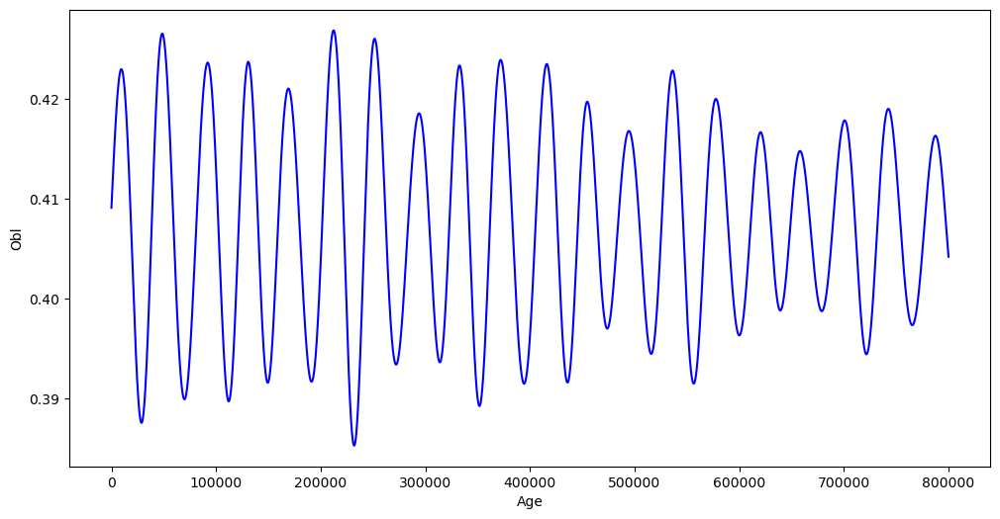

           age       pre
7999     100.0  0.016431
7997     300.0  0.016690
7995     500.0  0.016891
7993     700.0  0.017029
7991     900.0  0.017104
...        ...       ...
1597  640300.0 -0.002727
1595  640500.0 -0.003302
1593  640700.0 -0.003858
1591  640900.0 -0.004396
1589  641100.0 -0.004917

[3253 rows x 2 columns]
           age       obl
7999     100.0  0.409320
7997     300.0  0.409773
7995     500.0  0.410226
7993     700.0  0.410678
7991     900.0  0.411129
...        ...       ...
1597  640300.0  0.398943
1595  640500.0  0.398998
1593  640700.0  0.399062
1591  640900.0  0.399136
1589  641100.0  0.399218

[3253 rows x 2 columns]


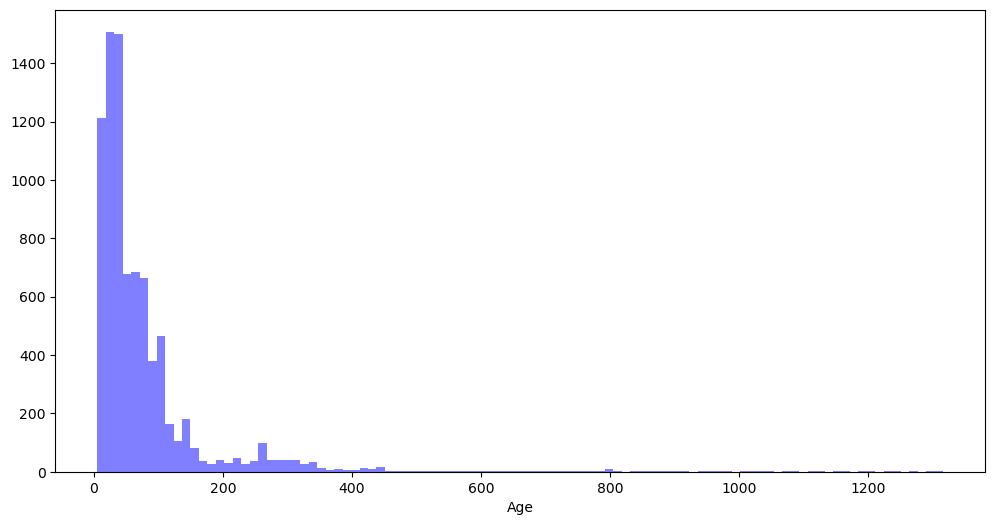

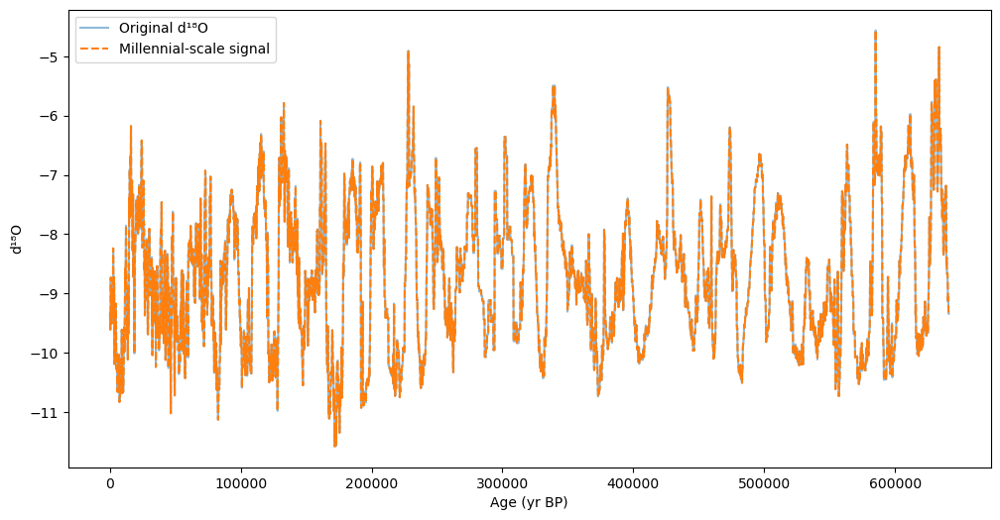

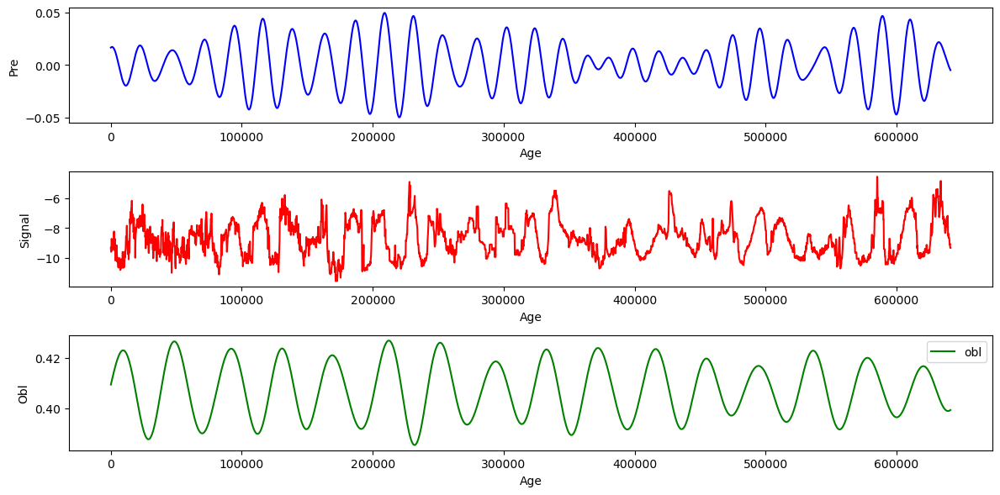

        age       pre
0  640900.0  0.016431
1  640700.0  0.016690
2  640500.0  0.016891
3  640300.0  0.017029
4  640100.0  0.017104


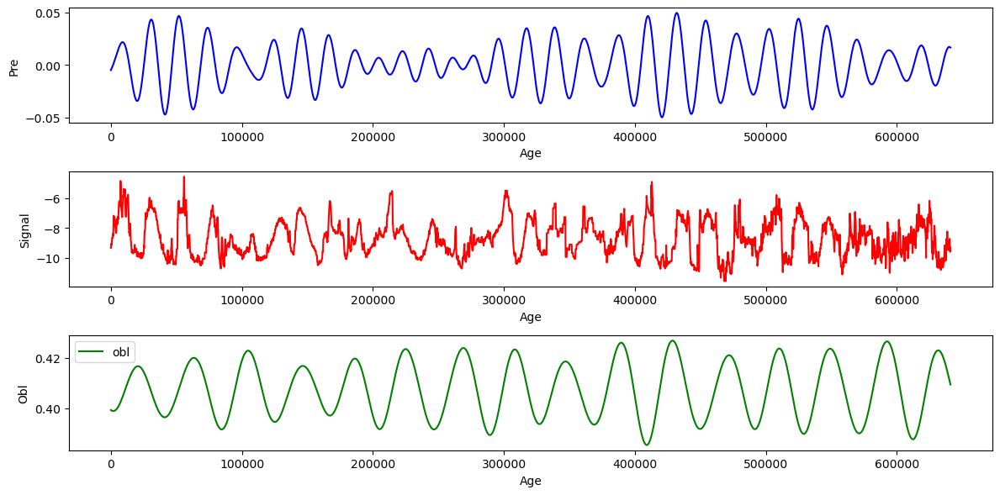

3253
3253


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# path to your file
file_path = r"D:\VScode\bipolar_seesaw_CCM\other_data\monsoon.xlsx"

# read the first sheet into a DataFrame
df = pd.read_excel(file_path)
# age =age *1000
df['age'] = df['age'] * 1000

print(df.head())
# print the age max and min
print(df['age'].max())
print(df['age'].min())



import pandas as pd
from scipy.interpolate import interp1d

# # Read the file into a DataFrame
# df_pre = pd.read_csv(
#     r"D:\VScode\bipolar_seesaw_CCM\inso_data\pre_800_inter100.txt", 
#     sep='\s+',       # '\s+' means "split on any whitespace"
#     header=None,     # or specify a row number if there's a header
#     engine='python'
# )

# df_obl = pd.read_csv(
#     r"D:\VScode\bipolar_seesaw_CCM\inso_data\obl_800.txt", 
#     sep='\s+',       # '\s+' means "split on any whitespace"
#     header=None,     # or specify a row number if there's a header
#     engine='python'
# )


# Read the file into a DataFrame
df_pre = pd.read_csv(
    r"D:\VScode\bipolar_seesaw_CCM\inso_data\pre_800_inter100.txt", 
    sep='\s+',       # '\s+' means "split on any whitespace"
    header=None,     # or specify a row number if there's a header
    engine='python'
)

df_obl = pd.read_csv(
    r"D:\VScode\bipolar_seesaw_CCM\inso_data\obl_800_inter100.txt", 
    sep='\s+',       # '\s+' means "split on any whitespace"
    header=None,     # or specify a row number if there's a header
    engine='python'
)

df_pre.iloc[:, 0] = df_pre.iloc[:, 0].abs() * 1000
df_obl.iloc[:, 0] = df_obl.iloc[:, 0].abs() * 1000

# Reverse the DataFrame rows
df_pre = df_pre.iloc[::-1]
df_pre.columns = ['age', 'pre']

df_obl = df_obl.iloc[::-1]
df_obl.columns = ['age', 'obl']

# plot df_pre
plt.figure(figsize=(12, 6))
plt.plot(df_pre.iloc[:, 0], df_pre.iloc[:, 1], label='pre', color='blue')
plt.xlabel("Age")
plt.ylabel("Pre")
print(df_pre)
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(df_obl.iloc[:, 0], df_obl.iloc[:, 1], label='obl', color='blue')
plt.xlabel("Age")
plt.ylabel("Obl")
print(df_obl)
plt.show()


# crop the df_pre between Start age:  9540 End age:  122280
df_pre = df_pre[(df_pre['age'] >= 0) & (df_pre['age'] <= 641200)]
df_obl = df_obl[(df_obl['age'] >= 0) & (df_obl['age'] <= 641200)]

# for pre and obl, drop the age that can be divided by 200
df_pre = df_pre[df_pre['age'] % 200 != 0]
df_obl = df_obl[df_obl['age'] % 200 != 0]

print(df_pre)
print(df_obl)


# plot a hist of the df age
plt.figure(figsize=(12, 6))
plt.hist(np.diff(df['age']), bins=100, color='blue', alpha=0.5)
plt.xlabel("Age")


# # build an interpolator; use 'nearest' to preserve the step
f = interp1d(df['age'], df['d18O'], kind='nearest',
             bounds_error=False,
             fill_value=1)            

interpolated_sq = f(df_pre['age'].values)



df=pd.DataFrame({'age':df_pre['age'].values,'d18O':interpolated_sq})
df_sd=df.copy()

# window = int(10000 / np.median(np.diff(df["age"])))
# df["smoothed"] = df["d18O"].rolling(window=window, center=True, min_periods=1).mean()

# # 3) Millennial‐scale signal = original minus low‐frequency
# df_sd["d18O"] = df["d18O"] - df["smoothed"]

# df_sd["d18O"] = df_sd["d18O"].rolling(window=50, center=True, min_periods=1).mean()



# reset index of df_sd and df_pre according to the sorted age
df_sd = df_sd.sort_values(by='age').reset_index(drop=True)
df_pre = df_pre.sort_values(by='age').reset_index(drop=True)
df_obl = df_obl.sort_values(by='age').reset_index(drop=True)

# 4) Plot to check
plt.figure(figsize=(12, 6))
plt.plot(df["age"], df["d18O"],       label="Original d¹⁸O",   alpha=0.5)
# plt.plot(df["age"], df["smoothed"],   label=f"{8000} yr rolling mean", linewidth=2)
plt.plot(df["age"], df["d18O"],     label="Millennial‐scale signal", linestyle="--")
# plt.gca().invert_xaxis()  # if age is “years before present”
plt.xlabel("Age (yr BP)")
plt.ylabel("d¹⁸O")
plt.legend()
plt.show()


# plot df_pre and df_sd in 2 by 1 subplots
plt.figure(figsize=(12, 6))
plt.subplot(3, 1, 1)
plt.plot(df_pre.iloc[:, 0], df_pre.iloc[:, 1], label='pre', color='blue')
plt.xlabel("Age")
plt.ylabel("Pre")
plt.subplot(3, 1, 2)
plt.plot(df_sd['age'], df_sd['d18O'], label='signal', color='red')
plt.xlabel("Age")
plt.ylabel("Signal")
plt.subplot(3, 1, 3)
plt.plot(df_obl['age'], df_obl['obl'], label='obl', color='green')
plt.xlabel("Age")
plt.ylabel("Obl")
plt.legend()
plt.tight_layout()
plt.show()




df_pre['age']=df_pre['age'].values * -1 +641000
df_sd['age']=df_sd['age'].values * -1 +641000
df_obl['age']=df_obl['age'].values * -1 +641000

print(df_pre.head())

# flip the two dfs upside down
df_pre = df_pre.iloc[::-1]
df_sd = df_sd.iloc[::-1]
df_obl = df_obl.iloc[::-1]

# reset index 
df_sd = df_sd.reset_index(drop=True)
df_pre = df_pre.reset_index(drop=True)
df_obl = df_obl.reset_index(drop=True)

# crop the first and last 50 rows of df_pre, df_obl and df_sd 
# df_pre = df_pre.iloc[50:-50]
# df_obl = df_obl.iloc[50:-50]
# df_sd = df_sd.iloc[50:-50]

# plot df_pre and df_sd in 2 by 1 subplots
plt.figure(figsize=(12, 6))
plt.subplot(3, 1, 1)
plt.plot(df_pre.iloc[:, 0], df_pre.iloc[:, 1], label='pre', color='blue')
plt.xlabel("Age")
plt.ylabel("Pre")
plt.subplot(3, 1, 2)
plt.plot(df_sd['age'], df_sd['d18O'], label='signal', color='red')
plt.xlabel("Age")
plt.ylabel("Signal")
plt.subplot(3, 1, 3)
plt.plot(df_obl['age'], df_obl['obl'], label='obl', color='green')
plt.xlabel("Age")
plt.ylabel("Obl")
plt.legend()
plt.tight_layout()
plt.show()

# print the length of df
print(len(df_pre))
print(len(df_sd))


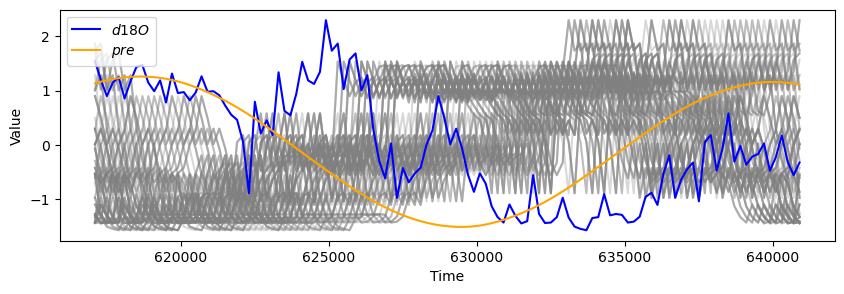

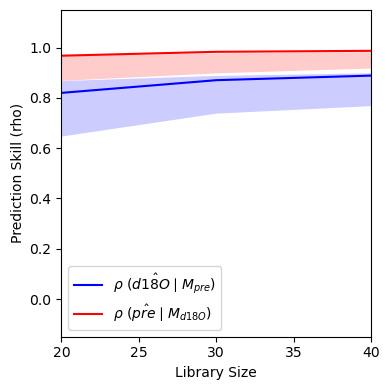

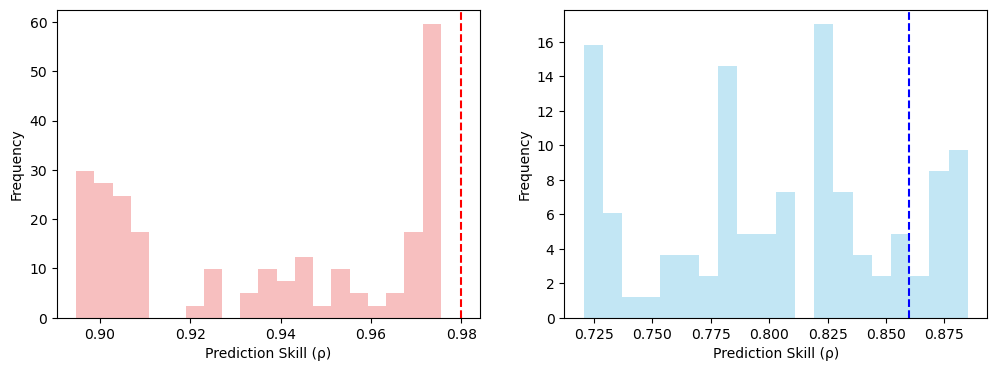

(True, False)


In [7]:
from toolbox import significant_test as st
import importlib
importlib.reload(st)

df_sd_crop = df_sd.copy()
df_pre_crop = df_pre.copy()

# get the last 120 rows of crop
df_sd_crop = df_sd_crop.iloc[-120:]
df_pre_crop = df_pre_crop.iloc[-120:]

ccm_out, ran_ccm_list_xy, test_result=st.ccm_significance_test_v2(
    df_sd_crop, 
    df_pre_crop,
    E=5, 
    tau=-10, 
    n_ran=100, 
    libSizes="20 30 40",
    Tp=0,
    sample=20,
    random=True,
    uni_dir=False,
    showPlot=True)
print(test_result)

# D18O vs pre, using sliding window

CCM windows:   0%|          | 0/61 [00:00<?, ?it/s]

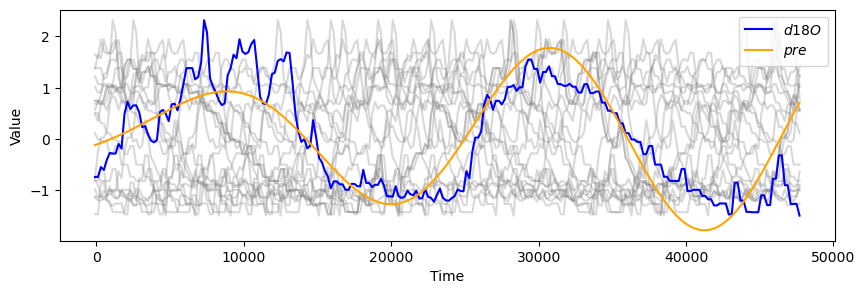

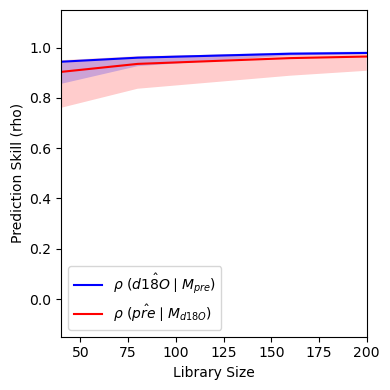

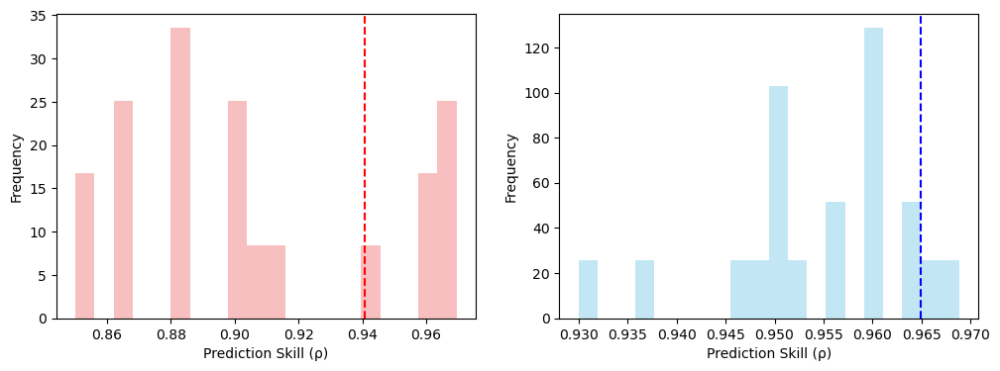

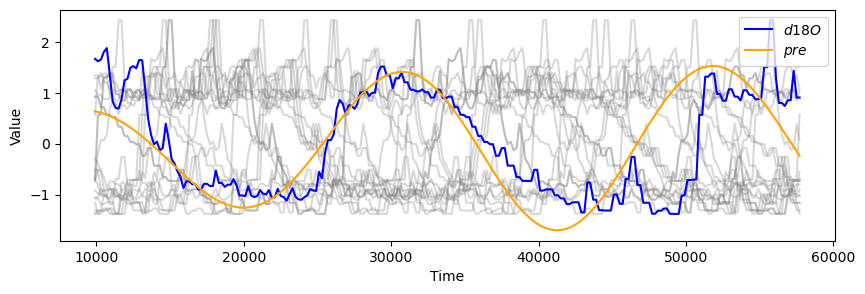

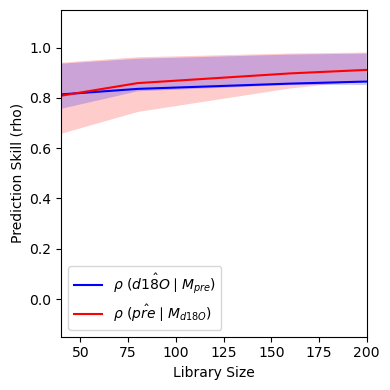

...

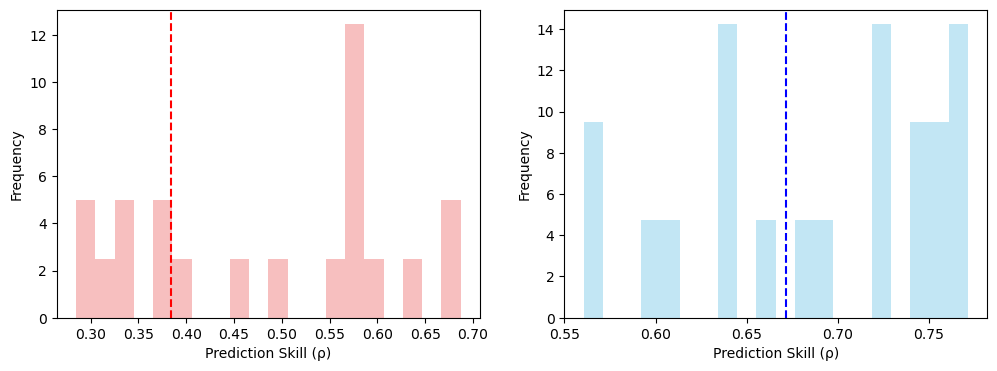

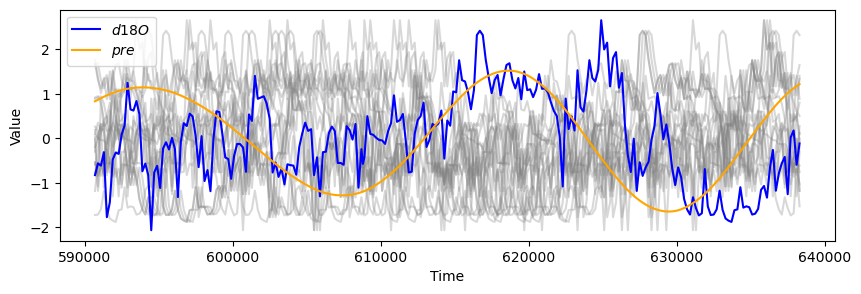

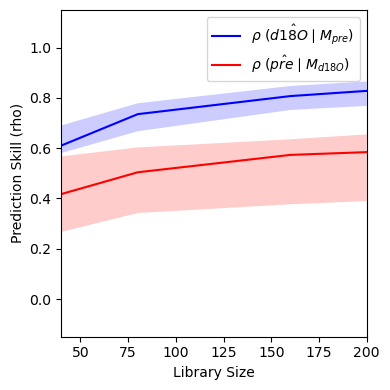

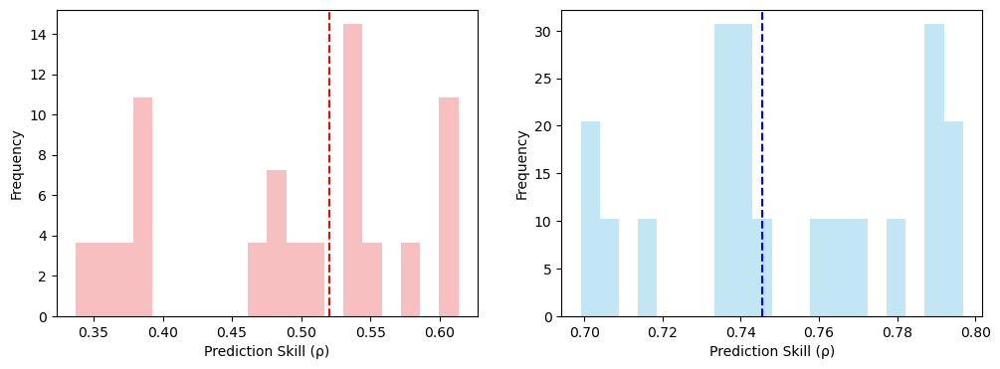

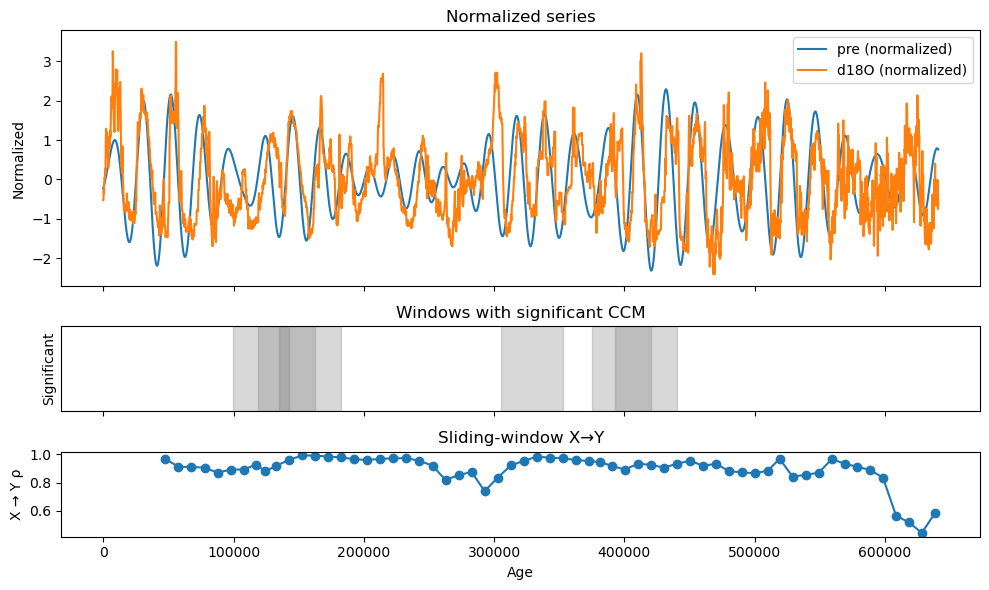

In [10]:
from toolbox import significant_test as st
import importlib
import matplotlib.pyplot as plt
import pandas as pd
from tqdm.auto import tqdm

importlib.reload(st)

# parameters
window_size = 240
step = 50
lib_sizes = "40 80 160 200"

# normalize the full series once
pre_norm = (df_pre['pre'] - df_pre['pre'].mean()) / df_pre['pre'].std()
sd_norm  = (df_sd['d18O'] - df_sd['d18O'].mean()) / df_sd['d18O'].std()

# storage
results = []

# how many windows
n_windows = ((len(df_sd) - window_size) // step) + 1

# slide the window, with tqdm progress bar
for start in tqdm(range(0, len(df_sd) - window_size + 1, step),
                  total=n_windows,
                  desc="CCM windows"):
    end = start + window_size
    sd_win  = df_sd.iloc[start:end]
    pre_win = df_pre.iloc[start:end]
    
    # run CCM (plots off)
    ccm_out, ran_ccm_list_xy, test_result = st.ccm_significance_test_v2(
        sd_win,
        pre_win,
        E=7,
        tau=-3,
        n_ran=20,
        libSizes=lib_sizes,
        Tp=0,
        sample=40,
        random=True,
        uni_dir=False,
        showPlot=True
    )
    
    # record window bounds, significance flag, and final X→Y
    window_start = sd_win['age'].iloc[0]
    window_end   = sd_win['age'].iloc[-1]
    sig_flag     = bool(test_result[0])         # first boolean test result
    x_to_y       = ccm_out.iloc[-1]['X:Y']
    
    results.append({
        'start': window_start,
        'end':   window_end,
        'sig':   sig_flag,
        'X→Y':   x_to_y
    })

# build DataFrame
res_df = pd.DataFrame(results)

# --- now plot the 3 rows ---
fig, axes = plt.subplots(
    nrows=3, ncols=1,
    sharex=True,
    figsize=(10, 6),
    gridspec_kw={'height_ratios': [3, 1, 1]}
)

# 1) Top: normalized pre & sd
axes[0].plot(df_pre['age'], pre_norm, label='pre (normalized)')
axes[0].plot(df_sd['age'],  sd_norm,  label='d18O (normalized)')
axes[0].set_ylabel('Normalized')
axes[0].legend(loc='upper right')
axes[0].set_title('Normalized series')

# 2) Middle: vertical spans where sig == True
for _, row in res_df.iterrows():
    if row['sig']:
        axes[1].axvspan(row['start'], row['end'], alpha=0.3, color='gray')
axes[1].set_ylabel('Significant')
axes[1].set_yticks([])  # no y‐axis labels
axes[1].set_title('Windows with significant CCM')

# 3) Bottom: X→Y correlation through time
axes[2].plot(res_df['end'], res_df['X→Y'], marker='o')
axes[2].set_ylabel('X → Y ρ')
axes[2].set_xlabel('Age')
axes[2].set_title('Sliding‐window X→Y')

plt.tight_layout()
plt.show()


CCM windows:   0%|          | 0/63 [00:00<?, ?it/s]

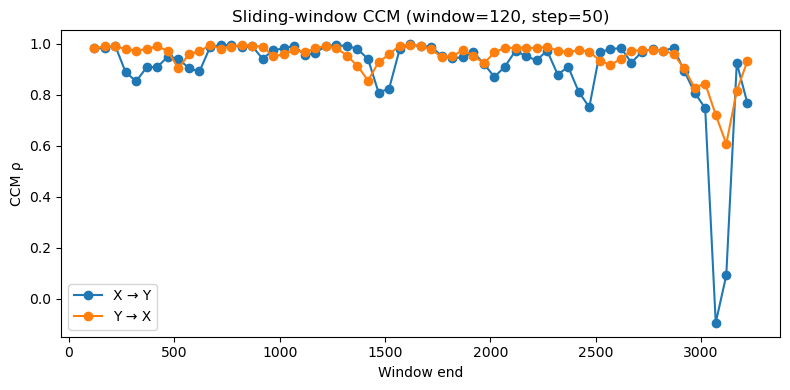

In [7]:
from toolbox import significant_test as st
import importlib
import matplotlib.pyplot as plt
import pandas as pd
from tqdm.auto import tqdm

importlib.reload(st)

# parameters
window_size = 120
step = 50
lib_sizes = "40 60 80"

# storage
results = []

# compute how many windows we’ll run
n_windows = ((len(df_sd) - window_size) // step) + 1

# slide the window, with tqdm progress bar
for start in tqdm(range(0, len(df_sd) - window_size + 1, step), 
                  total=n_windows, 
                  desc="CCM windows"):
    end = start + window_size
    sd_win = df_sd.iloc[start:end]
    pre_win = df_pre.iloc[start:end]
    
    # run the CCM test on this window (plots suppressed)
    ccm_out, ran_ccm_list_xy, test_result = st.ccm_significance_test_v2(
        sd_win,
        pre_win,
        E=7,
        tau=-3,
        n_ran=20,
        libSizes=lib_sizes,
        Tp=0,
        sample=20,
        random=True,
        uni_dir=False,
        showPlot=False
    )
    
    # record the window’s last X:Y & Y:X
    window_end = sd_win.index[-1]
    x_to_y = ccm_out.iloc[-1]['X:Y']
    y_to_x = ccm_out.iloc[-1]['Y:X']
    results.append({
        'window_end': window_end,
        'X→Y': x_to_y,
        'Y→X': y_to_x
    })

# build DataFrame
res_df = pd.DataFrame(results).set_index('window_end')

# plot
plt.figure(figsize=(8,4))
plt.plot(res_df.index, res_df['X→Y'], marker='o', label='X → Y')
plt.plot(res_df.index, res_df['Y→X'], marker='o', label='Y → X')
plt.xlabel('Window end')
plt.ylabel('CCM ρ')
plt.title('Sliding‐window CCM (window=120, step=50)')
plt.legend()
plt.tight_layout()
plt.show()
